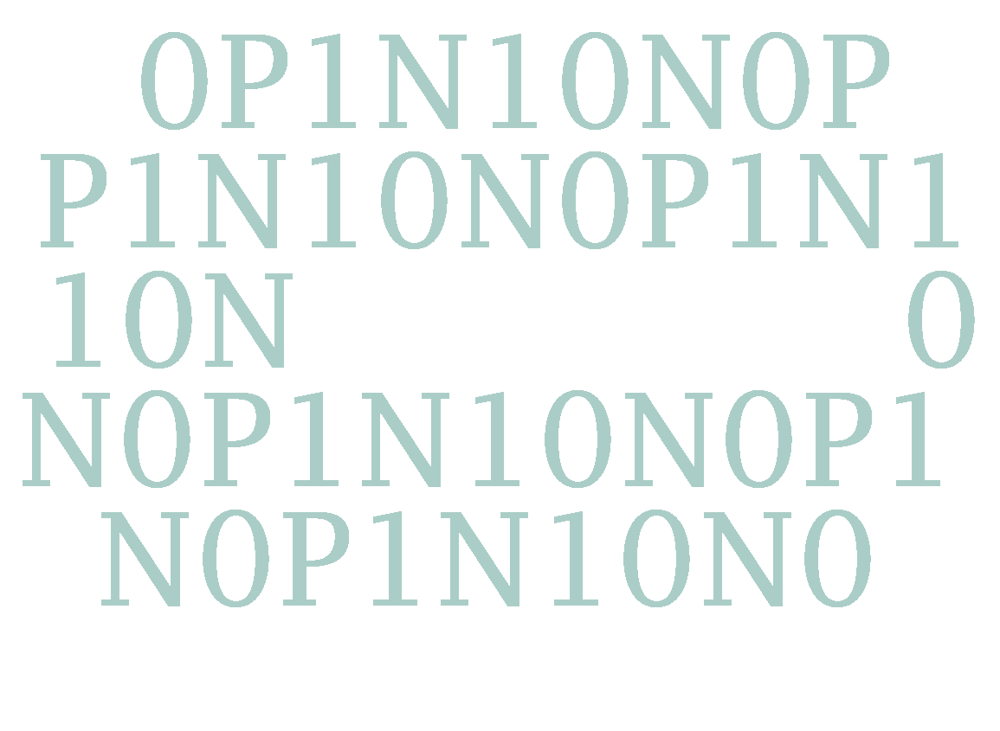

# Opinion Training School: Automated Image and Video Data Analysis with Python

## _Elbasan (May 29, 2025)_

### Instructor:

### Dr. Felicia Loecherbach (University of Amsterdam)


---
---


# Supervised Classification

<ins>**Objectives:**</ins>

- **load and implement pre-trained CNN**: you'll learn how to load and use a
  pre-trained CNN to generate class/image predictions on your images.

- **fine-tune a pre-trained CNN**: you'll learn how to fine-tune a pre-trained
  CNN to perform a new task of interest to you.

<ins>**Dataset:**</ins>

- **protest dataset**: a dataset with sample images of street protests, related
  to BLM protests (and images that are not of protests), that also Nora Webb
  Williams and Andreu Casas put together.

<ins>**Key module/s:**</ins>

- **PyTorch**: there are many deep learning library/modules for python (e.g.
  keras, pytorch, tensorflow). I started using PyTorch a while back. Back then
  they made it very easy to e.g. use open-source pre-trained models and modify
  the architecture of those models. These days all these libraries have really
  good and similar functionalities. I'll stick to pytorch in these tutorials,
  but any of these libraries would do the trick.


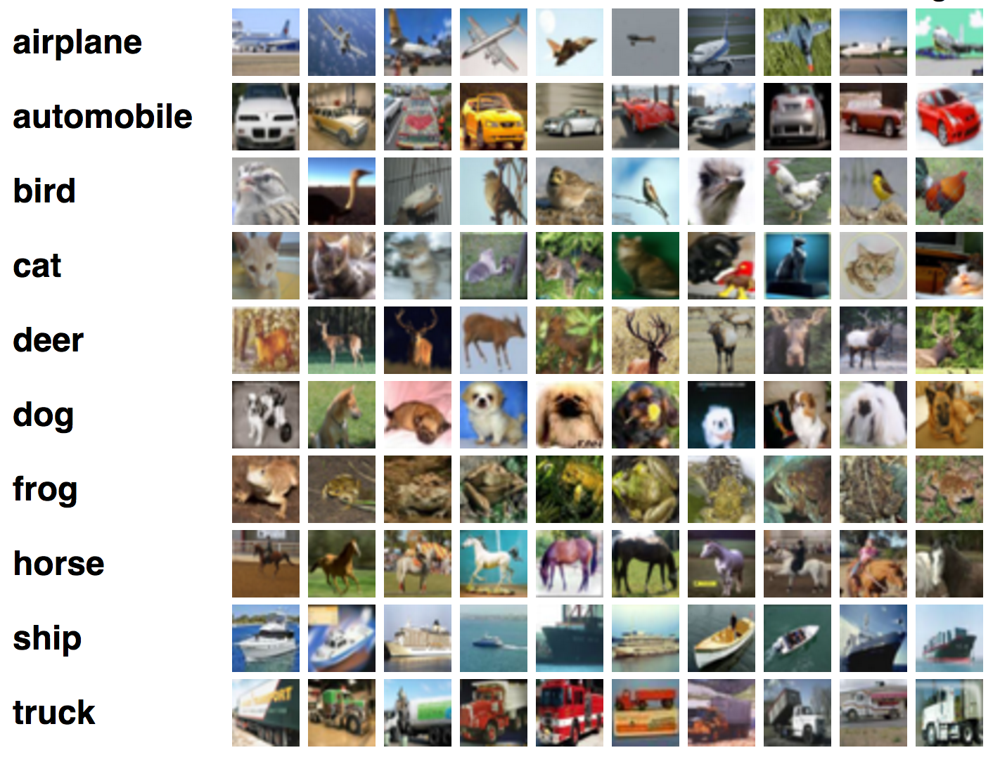


---
---


## Install the packages/modules that we'll be using. Set up GPU.

These google-colab notebooks allow us to run code in virtual machines located
elsewhere. Every time we start a session, the virtual machine is "empty", so
non-native python modules need to be installed. Let's install the ones we'll
need in this particular notebook. We'll do so using `pip` and the `!` marker
that allows us to run `bash` code in the same notebook.


In [1]:
# - before getting started, set up GPU.
import torch

# - the device name should look like the following:
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")
else:
    print("GPU is not available.")

GPU: Tesla T4


In [2]:
!pip install timm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 67.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 61.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 46.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 55.9 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitlin

In [3]:
# - install clip, one of the models we'll be using in the workshop
!pip install git+https://github.com/openai/CLIP.git

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-yhbs6mzh
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-yhbs6mzh
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 3.5 MB/s eta 0:00:00
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369490 sha256=9461b49d40167347581e778c62bc2a82bd88935c53403d3f5837402766b64a1a
  Stored in directory: /tmp/pip-ephem-wheel-cache-ibz17g76/wheels/3f/7c/a4/9b490845988bf7a4db33674d52f709f088f64392063872eb9a
Successfully built clip


In [4]:
# - load datasets package, used for creating Huggingface type datasets
!pip install datasets

In [5]:
!pip install git+https://github.com/huggingface/peft.git

  Cloning https://github.com/huggingface/peft.git to /tmp/pip-req-build-1ptth86e
  Running command git clone --filter=blob:none --quiet https://github.com/huggingface/peft.git /tmp/pip-req-build-1ptth86e
  Resolved https://github.com/huggingface/peft.git to commit b3130c9edb6071c6f90b42bede12c56b4ad59287
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for peft: filename=peft-0.15.2.dev0-py3-none-any.whl size=439583 sha256=691068b0e26458fb8d6a2f4bcde584615e4ba45d25f71370111a7a19a8aed1d2
  Stored in directory: /tmp/pip-ephem-wheel-cache-s8gaemdt/wheels/42/ec/c4/eb24dac74be83ba2ed4817037a784d1c775e317cb8de69963f
Successfully built peft
  Attempting uninstall: peft
    Found existing installation: peft 0.15.2
    Uninstalling peft-0.15.2:
      Successfully uninstalled peft-0.15.2


In [6]:
# - install a package that we'll use for quantization (reducing the size of weights of the VLM Idefics2)
!pip install bitsandbytes

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.0/67.0 MB 11.1 MB/s eta 0:00:00


## Load the modules that we'll be using


In [163]:
# --- Google Colab & System ---
from google.colab import drive  # Mount Google Drive
import os                      # Operating system interface
import sys                     # System-specific parameters and functions
import time                    # Time access and conversions
import random                  # Generate random numbers
import re                      # Regular expressions

# --- Data Handling & Visualization ---
import json                   # Working with JSON files
import numpy as np            # Numerical operations
import pandas as pd           # DataFrame handling
import matplotlib.pyplot as plt  # Plotting
import seaborn as sns         # Advanced plotting

# --- Image Processing ---
from PIL import Image         # Image manipulation and loading

# --- PyTorch & Deep Learning ---
import torch                  # Core PyTorch functionality
import torch.nn as nn         # Neural network layers and loss functions
import torch.optim as optim   # Optimization algorithms
from torch.optim import lr_scheduler  # Learning rate scheduler
from torch.autograd import Variable   # Tensor autograd wrapper (legacy, mostly)
from torch.utils.data import DataLoader  # Data batching and loading utilities
from transformers import AutoTokenizer, AutoProcessor

# --- TorchVision (Computer Vision) ---
import torchvision.models as models            # Pretrained models
import torchvision.transforms as transforms    # Image transformations
import torchvision.datasets as datasets        # Standard datasets
from torchvision.models import resnet50, ResNet50_Weights  # Specific ResNet model with weights

# --- Hugging Face / PEFT ---
from datasets import Dataset                   # Hugging Face Dataset object
from peft import LoraConfig, PeftModel, prepare_model_for_kbit_training  # Parameter-efficient fine-tuning tools

# --- TIMM & CLIP ---
import timm                                   # PyTorch Image Models library (extra pretrained models)
import clip                                   # OpenAI CLIP for image-text embeddings

# --- Scikit-learn (ML & Evaluation) ---
from sklearn.model_selection import train_test_split   # Train/test split
from sklearn.linear_model import LogisticRegression     # Logistic Regression model
from sklearn.neural_network import MLPClassifier        # Multi-layer perceptron classifier
from sklearn.metrics import (                           # Evaluation metrics
    precision_score,
    recall_score,
    precision_recall_fscore_support,
    accuracy_score,
    silhouette_score,
    silhouette_samples
)
from sklearn.cluster import KMeans                      # K-means clustering

# --- Utilities ---
from tqdm import tqdm                                   # Progress bars


## Mount the Google Drive for the workshop to this virtual machine


In [2]:
# - it will generate a url. Click on it, specify the google account you want to
#   use, and
drive.mount("/content/gdrive")

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


## Declare the data path


In [3]:
data_path = '/content/gdrive/MyDrive/images-as-data-workshop-elbasan/data/'
out_dir = '/content/gdrive/MyDrive/images-as-data-workshop-elbasan/output/'

## Load a pre-trained model and perform zero-shot classfication

`PyTorch` make it very easy to load and use CNN models that have been trained on
huge datasets and perform very very well at predicting a specific set of
image-classes/objects (e.g. car, truck, chair, horse, person, etc.). Let's first
learn how to load these pre-trained models using pytorch, and then use the model
to classify some sample images (what's commonly known as zero-shot
classification).


In [27]:
# - load pre-trained image model: Resnet50.
model = models.resnet50(weights='ResNet50_Weights.IMAGENET1K_V1')

# - set up the model to "evaluation" mode: so to avoid the model for training
#   further and the weights to be updated. We only want to generate predictions.
model.eval()

# - activate the GPU option, to make sure we're using it
model.cuda()

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 52.2MB/s]


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [28]:
# - load an image to use for testing
img_path = '{}dog.jpeg'.format(data_path)
img = Image.open(img_path).convert('RGB')

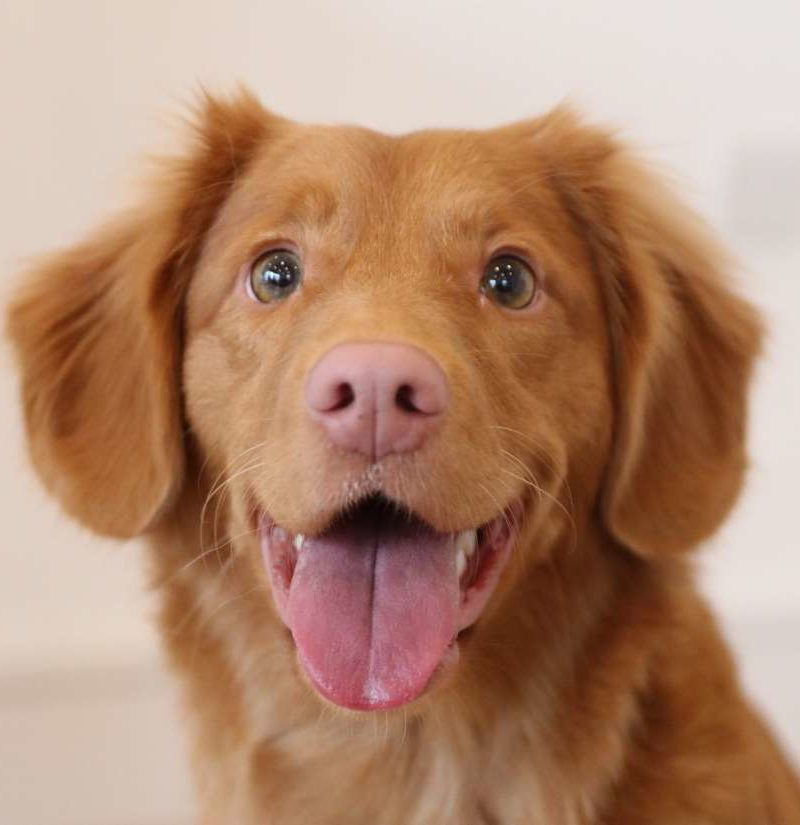

In [29]:
img

In [30]:
def data_transform(train=True, mean=[0.485, 0.456, 0.406],
                   sd=[0.229, 0.224, 0.225], scale=256, random_crop=224):
    """
    Description: This function creates an object to transform train and
        test (or only testing) images.
    Parameters:
        `train`: type <bool> indicating if the object will need to be used
                    to transform training and testing images (=True) or
                    only testing.
        `mean`: type <list> of 3 floats indicating the mean value of the 3 RGB
                    image inputs.
        `sd`: type <list> of 3 floats indicating the standard deviation of
                    the 3 RGB mean inputs.
        `scale`: type <int> indicating the new size to give to the train and
                    test data (e.g. 256x256 pixel images).
        `random_crop`: type <int> indicating the size of the part of the image
                    really used for training-testing (e.g. 224x224)
    Output:
        An object to be used for preprocessing the train and test images
    """
    common_transforms = [
        # Resize the image to the specified scale
        transforms.Resize(scale),
        # Center crop the image to the specified size
        transforms.CenterCrop(random_crop),
        # Convert the image to a tensor
        transforms.ToTensor(),
        # Normalize the image with the specified mean and standard deviation
        transforms.Normalize(mean, sd)
    ]

    if train:
        train_transforms = [
            # Randomly crop the image to the specified size
            transforms.RandomResizedCrop(random_crop),
            # Randomly flip the image horizontally
            transforms.RandomHorizontalFlip()
        ]
        data_transforms = {
            # Combine train-specific and common transforms
            'train': transforms.Compose(train_transforms + common_transforms),
            # Use only common transforms for testing
            'test': transforms.Compose(common_transforms)
        }
    else:
        # Use only common transforms if not training
        data_transforms = transforms.Compose(common_transforms)

    return data_transforms

In [31]:
# initialize the data_transform object that we'll use to pre-process the image
pre_processor = data_transform(train = False)

# initialize a softmax function that we'll use for generating Prob. predictions
softmax = torch.nn.Softmax(dim = 0)

In [32]:
# ... preprocess/normalize the image
img_transformed = Variable(pre_processor(img).unsqueeze(0))
# ... model predictions
model_out = model(img_transformed.cuda()).cpu()

In [33]:
# ... from logits to predicted Pr.
pred_probs = softmax(model_out[0])

In [34]:
# ... pull the maximum predicted pr and class
max_pr, max_class = torch.max(pred_probs, dim = 0)
print('Max Class: {} | Max Pr: {}'.format(max_class, max_pr))

Max Class: 215 | Max Pr: 0.4031156897544861


In [35]:
# - what is the class #215? How can we find out? A list of the 1,000 ImageNet
#   class number and label can be found e.g. here:
#   https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a

# - I already saved a copy of this file in our data directory. Let's load it
#   and look up the class label for 215
labels = json.load(open('{}imagenet_class_index.json'.format(data_path, 'rb')))

In [36]:
labels['215']

['n02101388', 'Brittany_spaniel']

In [37]:
# - feel free to take a look at the 1,000 classes of the ImageNet dataset. Most
#   of these pre-trained models are trained on this data -- and so predict the
#   same 1,000 classes
labels

{'0': ['n01440764', 'tench'],
 '1': ['n01443537', 'goldfish'],
 '2': ['n01484850', 'great_white_shark'],
 '3': ['n01491361', 'tiger_shark'],
 '4': ['n01494475', 'hammerhead'],
 '5': ['n01496331', 'electric_ray'],
 '6': ['n01498041', 'stingray'],
 '7': ['n01514668', 'cock'],
 '8': ['n01514859', 'hen'],
 '9': ['n01518878', 'ostrich'],
 '10': ['n01530575', 'brambling'],
 '11': ['n01531178', 'goldfinch'],
 '12': ['n01532829', 'house_finch'],
 '13': ['n01534433', 'junco'],
 '14': ['n01537544', 'indigo_bunting'],
 '15': ['n01558993', 'robin'],
 '16': ['n01560419', 'bulbul'],
 '17': ['n01580077', 'jay'],
 '18': ['n01582220', 'magpie'],
 '19': ['n01592084', 'chickadee'],
 '20': ['n01601694', 'water_ouzel'],
 '21': ['n01608432', 'kite'],
 '22': ['n01614925', 'bald_eagle'],
 '23': ['n01616318', 'vulture'],
 '24': ['n01622779', 'great_grey_owl'],
 '25': ['n01629819', 'European_fire_salamander'],
 '26': ['n01630670', 'common_newt'],
 '27': ['n01631663', 'eft'],
 '28': ['n01632458', 'spotted_salama

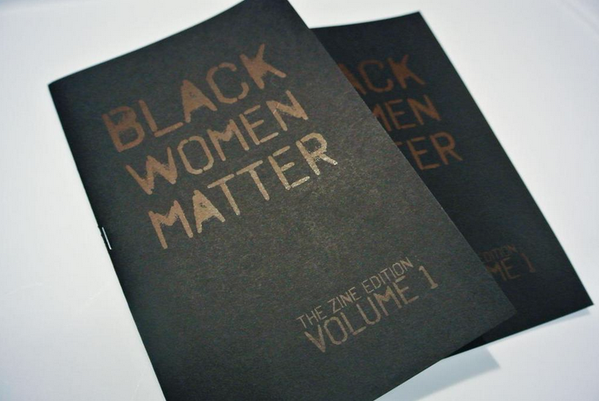

In [38]:
# - let's try the same thing with this other image
img_path = '{}protest/train/negative/55572.jpg'.format(data_path)
img = Image.open(img_path).convert('RGB')
img

In [39]:
# ... preprocess/normalize the image
img_transformed = Variable(pre_processor(img).unsqueeze(0))
# ... model predictions
model_out = model(img_transformed.cuda()).cpu()
# ... from logits to predicted Pr.
pred_probs = softmax(model_out[0])
# ... pull the maximum predicted pr and class
max_pr, max_class = torch.max(pred_probs, dim = 0)
print('Max Class: {} | Max Pr: {} | Label: {}'.format(
    max_class, max_pr,
    labels[str(max_class.numpy())][1]))

Max Class: 539 | Max Pr: 0.3284355103969574 | Label: doormat


## Fine-tuning a pre-trained model

A pre-trained model may do poorly in classifying images into some classes of
interest to us. If that's the case, we can try to leverage the many things the
model has already learned by being trained on millions on images, but then adapt
it to our particular classification task. To do so, we'll need to:

- (a) adapt the model architecture, by replacing the final fully connected layer
  for a layer that fits our classification task (so predicting e.g. 2 rather
  1,000 classes)
- (b) train the pre-trained model for a few more iterations

We'll now practice how to do this by fine-tuning a pre-trained model to predict
a binary outcome: whether an image is of a street **protest**. In order to do
so, we have already **collected** and **annotated** some data for our quantity
of interest (so we have some images we know are of street protests and some
images we know are not).

### Data structure

Here a look at how your data needs to be set up to fit the requirements of the
`ImageFolder` and `DataLoader` utilities in pytorch.

- `root-data-folder`
  - `train`
    - `class-label`
      - `img`
      - `img`
      - ...
    - `class-label`
      - `img`
      - `img`
      - ...
    - ...
  - `test`
    - ...
      - ...
  - `val`
    - ...
      - ...

Here for example how it's set up for the data we'll now use to fine-tune the
model to predict images of street protests.

- `protest`
  - `train`
    - `negative`
      - `img`
      - `img`
      - ...
    - `positive`
      - `img`
      - `img`
      - ...
  - `test`
    - `negative`
      - `img`
      - `img`
      - ...
    - `positive`
      - `img`
      - `img`
      - ...


In [40]:
# - load a pre-trained model: e.g. Resnet50
model = models.resnet50(weights='ResNet50_Weights.IMAGENET1K_V1')

In [41]:
# - specifying HYPERPARAMETERS (researcher's choice! Some rules of thumb, but
#   usually you should perform a grid search --try many setups-- to see which
#   particular hyperparameter configuration works best)

# - specify the new number of outcome classes: 2 (binary: protest | not-protest)
num_classes = 2

# - how often do you want the loop to print information about model performance
report_num = 1 # ... every iteration

# - hyperparameters
# Learning rate: How much to adjust the model
# with respect to the error each time the model weights are updated
set_learn_rate = 0.0001
# Momentum: Helps accelerate gradients
# vectors in the right directions, thus leading to faster converging
set_momentum = 0.9
# Step size: Number of epochs after which the learning rate is adjusted
set_step_size = 7
# Gamma: Multiplicative factor for learning rate decay
set_gamma = 0.1
# Number of iterations: How many times the entire dataset is passed through the model
iter_num = 10
# Batch size: Number of samples processed before the model is updated
set_batch_size = 4

In [42]:
# Loss function: Measures the difference between the predicted output and the actual output
criterion = nn.CrossEntropyLoss()
# Optimizer: Adjusts the model parameters to minimize
# the loss function using Stochastic Gradient Descent (SGD)
optimizer = optim.SGD(model.parameters(),
                         lr=set_learn_rate,
                         momentum=set_momentum)
# Learning rate scheduler: Adjusts the learning rate at regular intervals
# (step size) by multiplying it with a factor (gamma)
scheduler = lr_scheduler.StepLR(optimizer,
                                       step_size=set_step_size,
                                       gamma=set_gamma)

In [43]:
# - check number of features in last fully connected layer
num_ftrs = model.fc.in_features

# - change the output layer from 1,000 classes to a binary outcome
model.fc = nn.Linear(num_ftrs, num_classes) # For ResNet50, last step is 2048 -> 2

In [44]:
# - initialize preprocessing object
preprocess = data_transform()

In [45]:
# - specify the path to data for this particular classifier
model_path = '{}protest/'.format(data_path)

# - specifying where the train and test images are
image_datasets = {x: datasets.ImageFolder(os.path.join(model_path, x),
                                          preprocess[x]) for x in ['train', 'test']}

# - creating an object to easily load the train and test images
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x],
                                              batch_size=set_batch_size,
                                             shuffle=True)
              for x in ['train', 'test']}

# - getting some extra information such as the size of the dataset and the
#       class number
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'test']}
class_names = image_datasets['train'].classes

# - making sure again that we're using GPU. Also, taking the opportunity to check
#   the model architecture and making sure that the "prediction head" has been
#   replaced and is now set up to predict a binary outcome.
use_gpu = True # /!\ Set to False if you run it in a machine with no GPUs
if use_gpu:
  model.cuda()

#### Model Training/Fine-tuning


In [46]:
# Initialize variables
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'test']}
since = time.time()
best_model_wts = model.state_dict()  # Save the initial model weights
best_acc = best_precision = best_recall = 0.0
loss_progress, acc_progress = [], []

# Training loop
for iteration in range(iter_num):
    if iteration % report_num == 0:
        print(f'Iteration {iteration + 1}/{iter_num}')
        print('-' * 10)

    for phase in ['train', 'test']:
        # Set the model to training mode if phase is 'train', else set to evaluation mode
        model.train(phase == 'train')

        # Initialize running metrics
        running_loss = 0.0
        running_corrects = 0
        running_preds = []
        running_labels = []

        # Iterate over data
        for data in dataloaders[phase]:
            inputs, labels = data
            # Move data to GPU if available
            if use_gpu:
                inputs, labels = Variable(inputs.cuda()), Variable(labels.cuda())
            else:
                inputs, labels = Variable(inputs), Variable(labels)

            # Zero the parameter gradients
            optimizer.zero_grad()

            # Forward pass: compute the model output
            outputs = model(inputs)
            _, preds = torch.max(outputs.data, 1)  # Get the class with the highest score
            loss = criterion(outputs, labels)  # Compute the loss

            # Backward pass and optimize only if in training phase
            if phase == 'train':
                loss.backward()  # Compute the gradients
                optimizer.step()  # Update the model parameters

            # Update running metrics
            running_loss += loss.data  # Accumulate the loss
            running_corrects += torch.sum(preds == labels.data)  # Count the correct predictions
            running_preds.extend(preds.tolist())  # Collect predictions
            running_labels.extend(labels.tolist())  # Collect true labels

        # Calculate loss and accuracy for the current phase
        iter_loss = running_loss / dataset_sizes[phase]
        iter_acc = running_corrects / dataset_sizes[phase]

        # Calculate precision and recall using sklearn
        iter_precision = precision_score(running_labels, running_preds, average='binary')
        iter_recall = recall_score(running_labels, running_preds, average='binary')

        # Print metrics every report_num iterations
        if iteration % report_num == 0:
            print(f'{phase} Loss: {iter_loss:.4f} Acc: {iter_acc:.4f} Precision: {iter_precision:.4f} Recall: {iter_recall:.4f}\n')

        # Save the best model weights based on accuracy
        if phase == 'test' and iter_acc > best_acc:
            best_acc = iter_acc
            best_precision = iter_precision
            best_recall = iter_recall
            best_model_wts = model.state_dict()

        # Save loss and accuracy progress for plotting
        if phase == 'test':
            loss_progress.append(iter_loss.cpu())
            acc_progress.append(iter_acc.cpu())

    # Early stopping if model reaches good accuracy, precision, and recall
    if best_acc > 0.95 and best_precision > 0.95 and best_recall > 0.95:
        print('... Reached good model accuracy, moving to the next model.')
        break

# Calculate total training time
time_elapsed = time.time() - since
print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
print(f'Best val Acc: {best_acc:.4f}\n\n')


Iteration 1/10
----------
train Loss: 0.1822 Acc: 0.5000 Precision: 0.5000 Recall: 0.0235

test Loss: 0.1718 Acc: 0.6667 Precision: 1.0000 Recall: 0.3333

Iteration 2/10
----------
train Loss: 0.1623 Acc: 0.5588 Precision: 1.0000 Recall: 0.1176

test Loss: 0.1427 Acc: 0.7667 Precision: 1.0000 Recall: 0.5333

Iteration 3/10
----------
train Loss: 0.1458 Acc: 0.6706 Precision: 0.9677 Recall: 0.3529

test Loss: 0.1200 Acc: 0.9000 Precision: 1.0000 Recall: 0.8000

Iteration 4/10
----------
train Loss: 0.1287 Acc: 0.7824 Precision: 0.9800 Recall: 0.5765

test Loss: 0.1062 Acc: 0.9667 Precision: 1.0000 Recall: 0.9333

Iteration 5/10
----------
train Loss: 0.1223 Acc: 0.8176 Precision: 0.9821 Recall: 0.6471

test Loss: 0.0859 Acc: 0.9667 Precision: 1.0000 Recall: 0.9333

Iteration 6/10
----------
train Loss: 0.1207 Acc: 0.7941 Precision: 0.9167 Recall: 0.6471

test Loss: 0.0820 Acc: 0.9667 Precision: 0.9375 Recall: 1.0000

Iteration 7/10
----------
train Loss: 0.1168 Acc: 0.8176 Precision: 0.

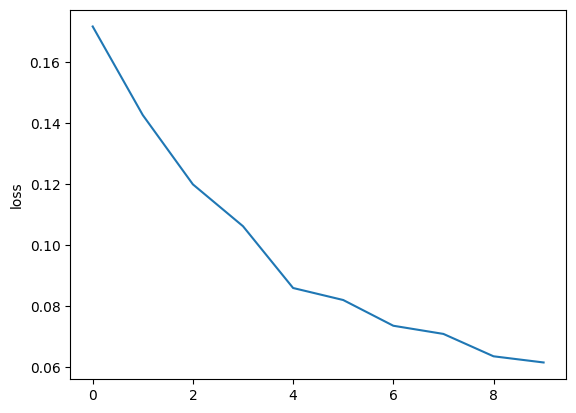

In [47]:
# - take a look at the evolution of the model loss
plt.plot(loss_progress)
plt.ylabel('loss')
plt.show()
plt.show()

In [48]:
# - save the best model weights and accuracy.
#   # /!\ This may lead to overfitting: not always the best practice. You can
#   also skip this next line and later save the model weights as they stand after
#   the last iteration.
model.load_state_dict(best_model_wts)

<All keys matched successfully>

In [49]:
# Function to visualize a grid of images
def imshow(inp, title=None):
    """
    Description: This function takes a grid of images and shows them, making
        image visualization easy.
    Parameters:
        `inp`:      type <torch.FloatTensor> object.
        `title`:    type <list> of strings indicating the labels of the `inp`
                        images.
    Output:
        shows the images and their labels (if provided)
    """
    # Convert tensor to numpy array and transpose dimensions
    inp = inp.numpy().transpose((1, 2, 0))
    inp = np.clip(inp, 0, 1)  # Clip values to be between 0 and 1 for display
    plt.imshow(inp)  # Display the image
    if title is not None:
        plt.title(title)  # Set the title if provided
    plt.pause(0.001)  # Pause to update the plot

# Function to visualize model predictions
def visualize_model(model, class_names, num_images, dataloaders, use_gpu):
    """
    Description: This function shows N (<num_images>) model predictions (top
        label + top probability).

    Parameters:
        `model`: type <torchvision.models.-modeltype->, the trained model.
        `num_images`: type <int> indicating the number of random images to show.
        `dataloaders`: type <dict> of a 'train' and a 'test
            torch.utils.data.dataloader.DataLoader.
        `use_gpu`: type <bool> indicating whether CUDA is available.

    Output:
        Prints out N predictions
    """
    images_so_far = 0  # Counter for the number of images displayed

    # Iterate over the test dataset
    for i, data in enumerate(dataloaders['test']):
        inputs, labels = data
        # Move data to GPU if available
        if use_gpu:
            inputs, labels = inputs.cuda(), labels.cuda()

        # Wrap inputs and labels in Variables
        inputs, labels = Variable(inputs), Variable(labels)

        # Forward pass to get model outputs
        outputs = model(inputs)
        _, preds = torch.max(outputs.data, 1)  # Get the predicted class

        # Iterate over the batch of inputs
        for j in range(inputs.size()[0]):
            images_so_far += 1
            ax = plt.subplot(num_images // 2, 2, images_so_far)  # Create a subplot
            ax.axis('off')  # Turn off axis
            ax.set_title(f'predicted: {class_names[preds[j]]}')  # Set the title with the predicted class
            imshow(inputs.cpu().data[j])  # Show the image

            # Stop if we have displayed the required number of images
            if images_so_far == num_images:
                return

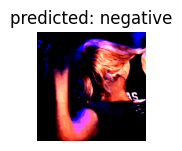

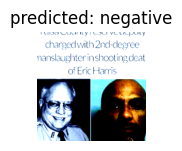

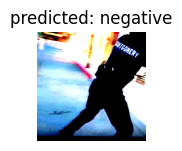

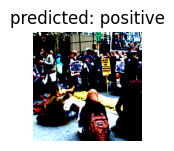

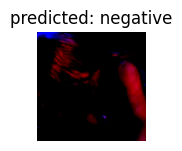

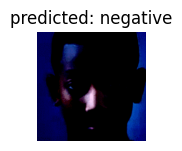

In [50]:
# - let's use it to check how the model classify some of the images in the test
#   set.
visualize_model(model = model,
                class_names = class_names,
                num_images = 6,
                dataloaders = dataloaders,
                use_gpu = use_gpu)

#### Saving, loading, and using the fine-tuned model


In [51]:
# - first create an new 'models' subdirectory in your output directory, where
#   we'll save the fine-tuned model

output_path = '/content/gdrive/MyDrive/images-as-data-workshop-elbasan/output/'
output_path02 = '{}/models/'.format(output_path)
if not os.path.isdir(output_path02):
  os.mkdir(output_path02)

In [52]:
# - PyTorch comes with a function to easily save models
model_filepath = '{}protest-model.pth'.format(output_path02)
torch.save(model, model_filepath)

In [53]:
# - here is how you can reload the model again
model_new = torch.load(model_filepath, weights_only = False)

In [54]:
# - using the model for generating predictions

# - load some example images to test how to use, on a "new" set of images, a model
#   you previously trained
pos_path = '{}protest/test/positive/'.format(data_path)
neg_path = '{}protest/test/negative/'.format(data_path)
pos_list = ['{}{}'.format(pos_path, x) for x in os.listdir(pos_path)[:5]]
neg_list = ['{}{}'.format(neg_path, x) for x in os.listdir(neg_path)[:5]]
test_img_path_list = pos_list + neg_list
new_dataset = []
for img_file in test_img_path_list:
    img = Image.open(img_file).convert('RGB')
    new_dataset.append(img)

In [55]:
len(new_dataset)

10

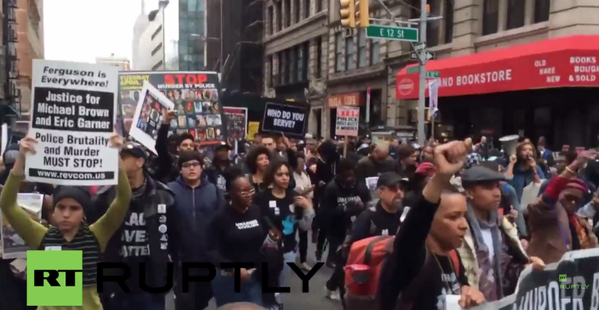

In [56]:
new_dataset[0]

In [57]:
# - specifying the transformation-preprocessing to apply to the images
preprocess = data_transform(train = False)

# - checking if the machine has GPUs and enabling GPU computing if so
use_gpu = torch.cuda.is_available()

In [58]:
# - use the model to perform predictions on this "new" set of images
# ... initialize output dataset and a counter
sigmoid = nn.Sigmoid() # Sigmoid rather than Softmax activation: binary outcome
output_data = pd.DataFrame()
counter = 0
total = len(new_dataset)
# ... iterate through the new images to predict
for z in range(0, len(new_dataset)):
    counter += 1
    print('image: {}/{}'.format(counter, total))
    img_filename = test_img_path_list[z]
    img = new_dataset[z]
    # ... initialize output dict object for this iteration/img
    new_entry = {}
    # ... transform-preprocess this imags
    var = Variable(preprocess(img).unsqueeze(0))
    # ... make the model prediction
    pred = model_new(var.cuda())
    # ... pull the predicted class probabilities and create a dataframe with them
    probs, indeces = sigmoid(pred).cpu().data.sort()
    probs = [round(x, 3) for x in list(probs.numpy()[0])]
    indeces = list(indeces[0][:2])
    labels = [['negative', 'positive'][i] for i in indeces]
    pred_df = pd.DataFrame({'label':labels,
                            'probs':probs})
    pred_df_t = pred_df.transpose()
    final_pred_df = pd.DataFrame(pred_df_t.iloc[1]).transpose()
    final_pred_df.columns = labels
    # ... adding some extra information about the image and prediction
    final_pred_df['img'] = '/'.join(img_filename.split('/')[-2:])
    final_pred_df['max_class'] = ['negative', 'positive'][indeces[1]]
    final_pred_df['max_pr'] = max(probs)
    output_data = pd.concat([output_data, final_pred_df])
output_data = output_data.reset_index(drop=True)

image: 1/10
image: 2/10
image: 3/10
image: 4/10
image: 5/10
image: 6/10
image: 7/10
image: 8/10
image: 9/10
image: 10/10


In [59]:
output_data

,negative,positive,img,max_class,max_pr
0,0.214,0.818,positive/52870.jpg,positive,0.818
1,0.438,0.598,positive/45021.jpg,positive,0.598
2,0.259,0.796,positive/51085.jpg,positive,0.796
3,0.357,0.661,positive/53260.jpg,positive,0.661
4,0.358,0.657,positive/52723.jpg,positive,0.657
5,0.858,0.105,negative/4259.jpg,negative,0.858
6,0.465,0.559,negative/8590.jpg,positive,0.559
7,0.568,0.176,negative/9093.jpg,negative,0.568
8,0.804,0.109,negative/7896.jpg,negative,0.804
9,0.788,0.201,negative/45130.jpg,negative,0.788


# Unsupervised Classification

<ins>**Objectives:**</ins>

- **generate image embeddings**: you'll learn how to use a pre-trained CNN for
  generating image embeddings.

- **conduct image clustering**: you'll learn how to use image embeddings for
  clustering images into cohesive groups.

- **evaluate hyperparameters**: you'll learn how to evaluate the effect of some
  key hyperparameters on the output of you unsupervised image classification

<ins>**Datasets:**</ins>

- **protest dataset**: a dataset with sample images of street protests, related
  to BLM protests (and images that are not of protests), that also Nora and I
  put together.


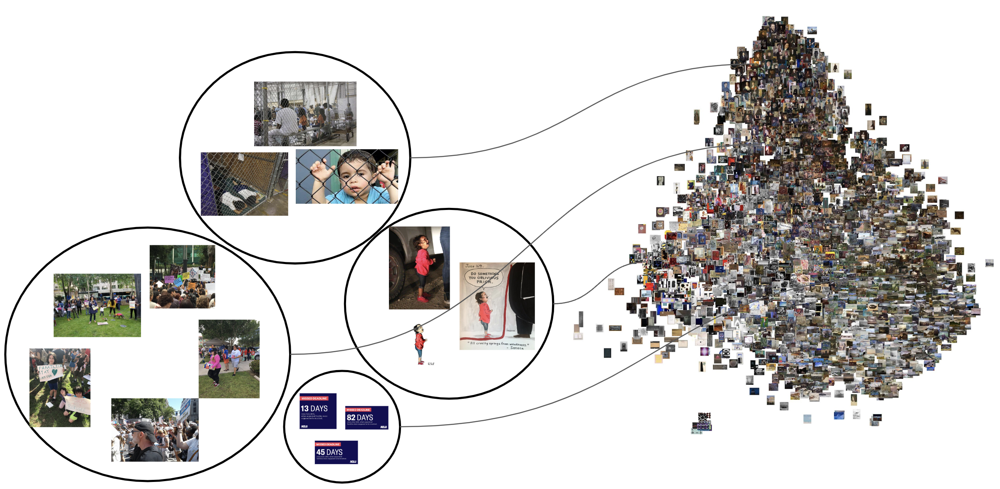


In [60]:
model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

## Drop the last fully-connected layer of the model

This way we can easily pass images through the model, and get the output of the
second-to-last layer. These outputs are dense vector representation of the
images (embeddings), and will be very useful for identifying similar images and
clustering them together


In [61]:
embed_gen = nn.Sequential(*list(model.children())[:-1])

## Data to be clustered

We'll use the **protest dataset** used in the supervised classification
tutorial. Let's create a list of paths to all the images, so that we can easily
work with them


In [62]:
# - initialize empty list
imgpaths = []
# - iterate through the 'protest' data folder, and pull the path to the train/test
#   and postitive/negative ones.
protest_path = '{}protest/'.format(data_path)
protest_subdirs = [x for x in os.listdir(protest_path) if '.DS_Store' not in x]
for subdir in protest_subdirs:
  protest_subsubdirs = [x for x in os.listdir('{}{}'.format(protest_path, subdir))
                        if '.DS_Store' not in x]
  for subsubdir in protest_subsubdirs:
    imgfiles = os.listdir('{}{}/{}'.format(protest_path, subdir, subsubdir))
    imgfiles02 = ['{}{}/{}/{}'.format(protest_path, subdir, subsubdir, x)
                  for x in imgfiles if '.jpg' in x]
    imgpaths.extend(imgfiles02)

In [63]:
len(imgpaths)

200

In [64]:
imgpaths[:4]

['/content/gdrive/MyDrive/images-as-data-workshop-elbasan/data/protest/train/negative/4924.jpg',
 '/content/gdrive/MyDrive/images-as-data-workshop-elbasan/data/protest/train/negative/4655.jpg',
 '/content/gdrive/MyDrive/images-as-data-workshop-elbasan/data/protest/train/negative/3866.jpg',
 '/content/gdrive/MyDrive/images-as-data-workshop-elbasan/data/protest/train/negative/4587.jpg']

## Using pre-trained model for generating image embeddings

Now let's used the version of the pre-trained ResNet50 model, for which we've
dropped the last fully-connected layer, to generate image embeddings, by passing
the images trough the model and pulling the vector representation outputed by
that second-to-last layer of the model.

The resulting embeddings will be of size 2048


In [65]:
# - initialize an empty list where we'll be placing the output embeddings
embed_out = []

# - create a preprocessing object
resnet_preprocess = data_transform(train = False)

# - iterate through the images and generate the two different embeddings
for ipath in tqdm(imgpaths):
  img = Image.open(ipath).convert('RGB')
  img_transformed = Variable(resnet_preprocess(img).unsqueeze(0))
  img_vect_raw = embed_gen(img_transformed.cuda()).data.cpu()
  img_vect = [float(x[0][0]) for x in list(img_vect_raw[0])]
  embed_out.append(img_vect)

100%|██████████| 200/200 [00:06<00:00, 32.68it/s]


## Clustering

- First, we'll create a single matrix with all the image embeddings (200 x 2048)
- Then, we'll use a Kmeans clustering algorithm to cluster the images
- We'll try out different numbers of clusters; and assess which number of
  clusters best fits the data


In [66]:
# - list of embeddings into a single matrix
embed_mat = np.array(embed_out)

In [67]:
# - let's take a quick look at the shape of this matrix: 200 (images) X 2048 (size of the embedding)
embed_mat.shape

(200, 2048)

In [68]:
# - here how the embedding representation of the first image looks like
embed_out[0]

[0.23697875440120697,
 0.812844455242157,
 0.3850097060203552,
 0.09338226169347763,
 0.806111752986908,
 0.20922526717185974,
 1.021743893623352,
 0.29627060890197754,
 0.49553850293159485,
 0.5124474763870239,
 0.26560676097869873,
 0.04915957525372505,
 1.2301020622253418,
 0.6114532351493835,
 0.7125430107116699,
 1.1099988222122192,
 0.3861129879951477,
 0.32655566930770874,
 0.739717423915863,
 0.34159013628959656,
 0.2791266441345215,
 0.936281144618988,
 0.5749804973602295,
 0.07637295126914978,
 0.23399998247623444,
 0.15704980492591858,
 1.0623542070388794,
 0.3340909779071808,
 0.5353063941001892,
 0.1180422455072403,
 0.12234164029359818,
 0.47518888115882874,
 0.6872472763061523,
 1.0429028272628784,
 1.1422154903411865,
 0.49665266275405884,
 0.2328367382287979,
 0.528715968132019,
 0.4366878867149353,
 0.22195199131965637,
 0.6027105450630188,
 0.2640271484851837,
 0.36794236302375793,
 0.176943838596344,
 0.4620775282382965,
 0.38401392102241516,
 0.19381083548069,
 0.3

In [69]:
# - now let's cluster these image embeddings, every time using a different number
#   of clusters. This is one of the key hyperamaters to take into consideration
k_options = range(2, 60, 2) # any possible even value between 2 and 60,
gof_scores = pd.DataFrame() # an empty data frame where we'll store information about goodnes of fit for each clustering option
counter = 0
for k in tqdm(k_options):
  km = KMeans(n_clusters = k)
  km.fit(embed_mat)
  k_gof = km.score(embed_mat)
  gof_newrow = pd.DataFrame({
      'k':k,
      'gof':k_gof
  }, index = [counter])
  gof_scores = pd.concat((gof_scores, gof_newrow))
  counter += 1

100%|██████████| 29/29 [00:01<00:00, 20.92it/s]


In [70]:
gof_scores.head()

,k,gof
0,2,-55596.351892
1,4,-49317.799542
2,6,-47044.748462
3,8,-45674.315078
4,10,-44133.983915


<Axes: xlabel='k', ylabel='gof'>

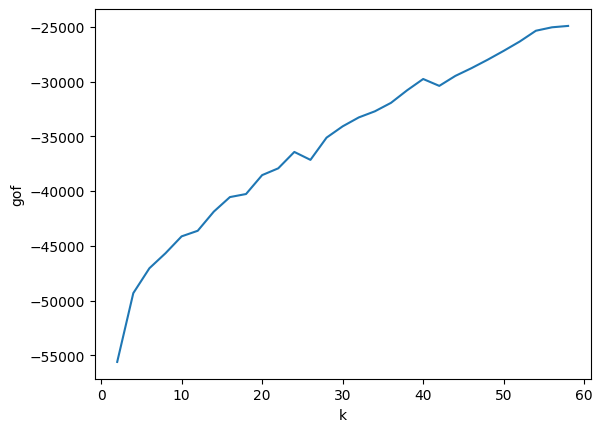

In [71]:
# - plot the goodness of fit measure against the number of clusters (k parameter)
sns.lineplot(data=gof_scores, x="k", y="gof")

In [89]:
# - around 8-13 cluster the increment in terms of goodness of fit only seems to
#   be marginal. To avoid overfitting, let's move forward with e.g. 10 clusters
# - let's then fit this final clustering model with 10 clusters
km = KMeans(n_clusters = 10,
            init='k-means++',
            max_iter=100,
            n_init=1,
            random_state = 1234) # set a random seed for replicability purposes
km.fit(embed_mat)

KMeans(max_iter=100, n_clusters=10, n_init=1, random_state=1234)

In [90]:
# - now let's pull the cluster assignment for each of the 200 images, and store
#   the information in dataframe where we also have information about the path
#   to each image
cl_out = pd.DataFrame({
    'image_path':imgpaths,
    'cluster':km.labels_
})

In [91]:
# - let's quickly explore how this dataframe looks like
cl_out.head()

,image_path,cluster
0,/content/gdrive/MyDrive/images-as-data-worksho...,1
1,/content/gdrive/MyDrive/images-as-data-worksho...,3
2,/content/gdrive/MyDrive/images-as-data-worksho...,3
3,/content/gdrive/MyDrive/images-as-data-worksho...,1
4,/content/gdrive/MyDrive/images-as-data-worksho...,3


## Explore the resulting clusters

- Take a look at the clusters


In [92]:
# - a function that helps merge images together into a single image, so that
#   we can visualize a set of images together
def show_combined_images(path_list):
  """
  path_list: a list of paths to the image files to be combined into a single one
  """
  images = [Image.open(x) for x in path_list]
  widths, heights = zip(*(i.size for i in images))

  total_width = sum(widths)
  max_height = max(heights)

  new_img = Image.new('RGB', (total_width, max_height))

  x_offset = 0
  for im in images:
    new_img.paste(im, (x_offset,0))
    x_offset += im.size[0]

  return(new_img)

In [93]:
# - take a quick look at the cluster size distribution
cl_out.groupby(['cluster']).size().reset_index().rename(
    columns = {0:'n'}).sort_values('n', ascending = False)

,cluster,n
4,4,50
5,5,48
1,1,25
2,2,20
3,3,18
7,7,16
6,6,12
8,8,5
0,0,3
9,9,3


In [94]:
# - sample e.g. 5 images from cluster 5
sample5_cl5 = list(cl_out[cl_out['cluster'] == 5].sample(5)['image_path'])

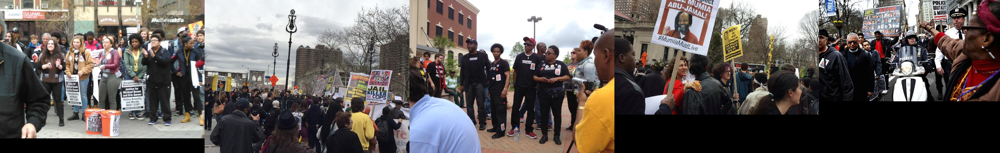

In [95]:
show_combined_images(sample5_cl5)

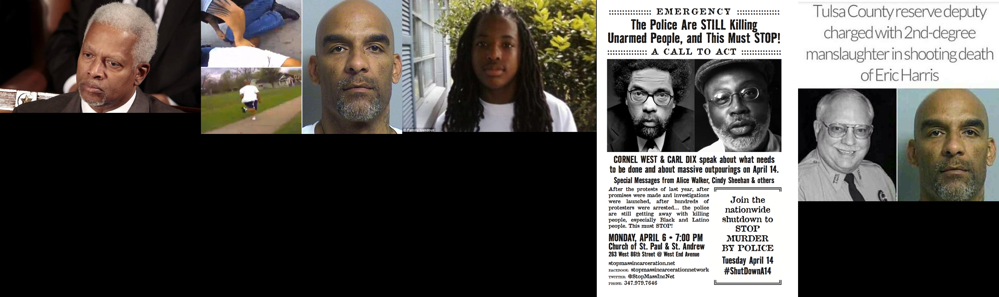

In [96]:
sample5_cl3 = list(cl_out[cl_out['cluster'] == 3].sample(5)['image_path'])
show_combined_images(sample5_cl3)

In [97]:
# - some of the resulting clusters are more "cohesive" than others. the silhouette
#   scores can help us identify less cohesive clusters (e.g. for further
#   clustering). We can get silhouette scores for each image (provides
#   information about how that image is similar to other images in that cluster,
#   and dissimilar to images in other clusters). I ranges from -1 to 1, where 1
#   means very high within-cluster similarity, and very low across-cluster
#   similarity.
cl_out['sil_score'] = silhouette_samples(embed_mat, km.labels_)

In [98]:
cl_out.head()

,image_path,cluster,sil_score
0,/content/gdrive/MyDrive/images-as-data-worksho...,1,-0.093564
1,/content/gdrive/MyDrive/images-as-data-worksho...,3,0.034740
2,/content/gdrive/MyDrive/images-as-data-worksho...,3,0.027426
3,/content/gdrive/MyDrive/images-as-data-worksho...,1,-0.068405
4,/content/gdrive/MyDrive/images-as-data-worksho...,3,-0.044079


In [99]:
cl_out.groupby(['cluster']).mean('sil_score').sort_values('sil_score')

,sil_score
cluster,
1,-0.040048
0,-0.019584
8,-0.011611
3,0.002265
5,0.030835
4,0.033884
6,0.053567
7,0.055336
2,0.131356


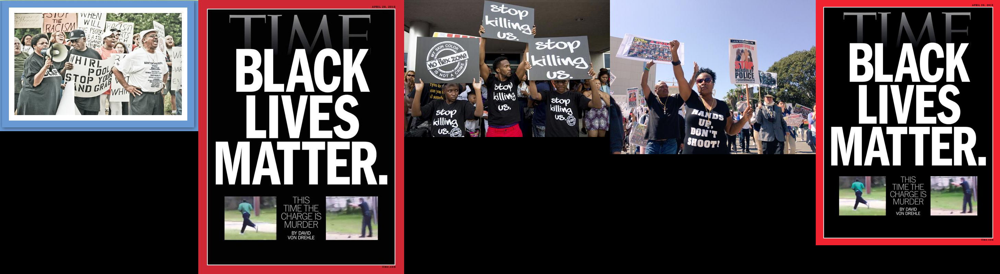

In [100]:
sample5_cl1 = list(cl_out[cl_out['cluster'] == 1].sample(5)['image_path'])
show_combined_images(sample5_cl1)

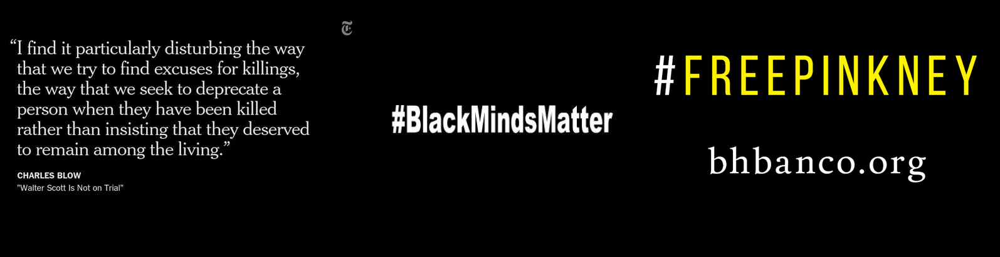

In [101]:
sample3_cl9 = list(cl_out[cl_out['cluster'] == 9].sample(3)['image_path'])
show_combined_images(sample3_cl9)

# Multimodal Modeling (Text + Images)

<ins>**Objectives:**</ins>

- **train supervised multimodal models**: you'll learn how to train two
  supervised multimodal (text + image) models: a neural network
  ([CLIP](https://openai.com/index/clip/)) and a Visual Language Model
  ([Idefics2](https://huggingface.co/docs/transformers/main/en/model_doc/idefics2))

<ins>**Data/Datasets:**</ins>

- **interest group twitter dataset**:
  (`ig-tweets-coded-and-translated-balanced-sample-n300.csv`) Toy dataset with
  300 tweets from interest groups from the US, Denmark, and Germany. These
  tweets have been manually annotated for whether they are about lobbying
  (binary). Those about lobbying have been coded for they represent a form of
  direct v. indirect lobbying. And those that aren't about lobbying have also
  been annotated for a set of non-lobbying categories. The dataset is balanced
  across these different target variables and classes.


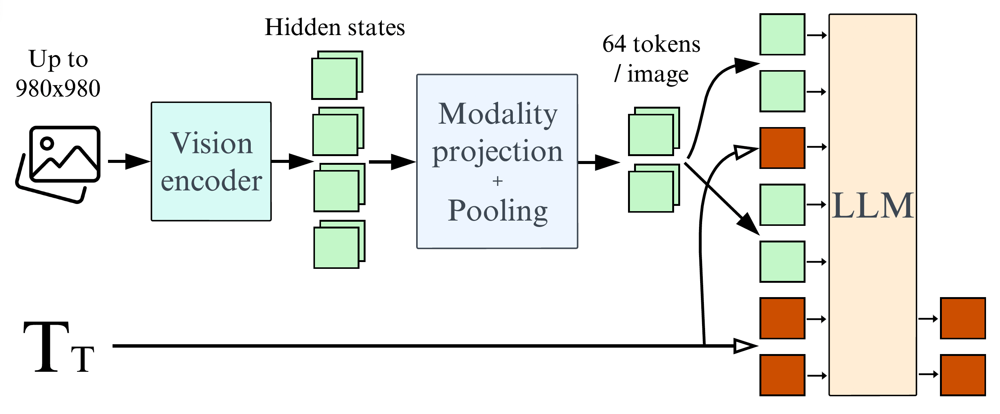


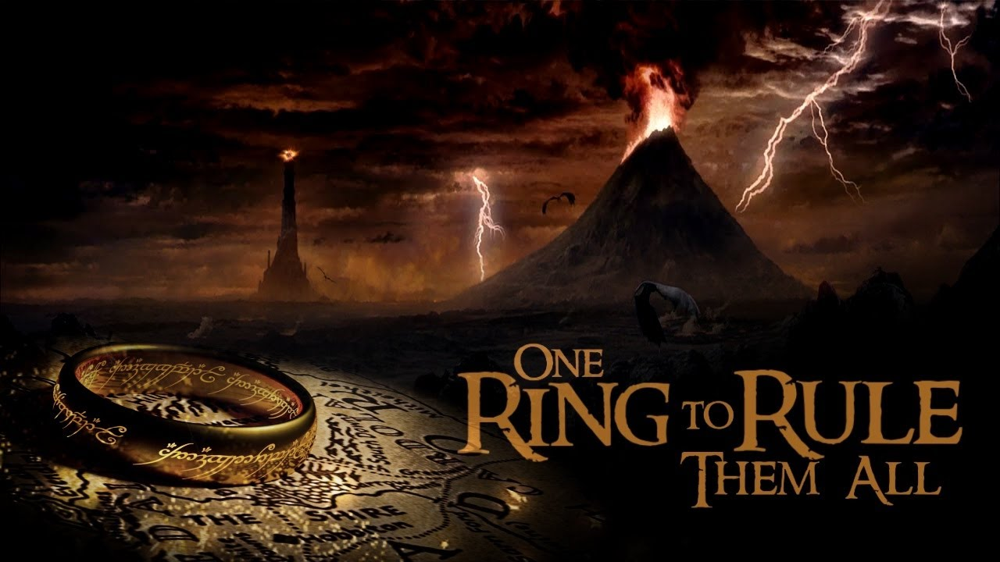


In [102]:
from transformers import (
    TrainingArguments,
    Trainer,
    AutoModelForVision2Seq,
    Idefics2ForConditionalGeneration,
    AutoProcessor,
    AutoModelForCausalLM,  # AutoModel for language modeling tasks
    AutoTokenizer,  # AutoTokenizer for tokenization
    BitsAndBytesConfig,  # Configuration for BitsAndBytes
    HfArgumentParser,  # Argument parser for Hugging Face models
    TrainingArguments,  # Training arguments for model training
    pipeline,  # Creating pipelines for model inference
    logging,  # Logging information during training
)

In [103]:
# - set up the data path where the images are located for this workshop
img_path = f'{data_path}ig-300sample/'

In [104]:
# - load dataset with 300 annotated tweets from interest groups
db = pd.read_csv(
    f'{data_path}ig-tweets-coded-and-translated-balanced-sample-n300.csv',
    dtype = 'str')

In [105]:
# - take a look at the first couple rows
db.head(2)

,tweet_id,country,org_name,day,user_id,user_name,text,text_en,lobbying,lobbying_type,non_lobbying_type
0,981517038006013954,us,Erickson Living,2018-04-04 13:01:12,487857720,ericksonliving,"Our biggest fans this week: @DaniB_Erickson, @...","Our biggest fans this week: @DaniB_Erickson, @...",0,NaN,community
1,918072966025482240,den,IT-Branchen,2017-10-11 11:17:06,1585749301,ITBranchen,Du kan ndre lovgivningen https://t.co/g51ydymp...,Du kan ndre lovgivningen https://t.co/g51ydymp...,1,indirect,NaN


In [106]:
# - save 20% for testing. Set random seed (e.g. to "123"). Use the tweet IDs
#   to keep track about which ones are in the train v. test sets
train_tids, test_tids = train_test_split(list(db['tweet_id']),
                                         test_size = 0.2,
                                         random_state = 123)

## CLIP

How it works, step by step


In [107]:
# - load clip model and processor
clip_model, clip_preprocess = clip.load("ViT-B/32", "cuda")

100%|███████████████████████████████████████| 338M/338M [00:04<00:00, 76.5MiB/s]


In [108]:
# - let's focus on a single interest group tweet: https://x.com/BPFINews/status/839765117738811393
tweet = db[db['tweet_id'] == "839765117738811393"].iloc[0]
example_text = tweet.text
example_imgname = f'{tweet.user_id}_{tweet.tweet_id}.jpeg'

In [109]:
print(f'{tweet.tweet_id} from {tweet.org_name}:\n- Text: {example_text}\n- Image filename: {example_imgname}')

839765117738811393 from Banking & Payments Federation Ireland:
- Text: We have just kicked off here @themarkerhotel for our #digital conference with @DeloitteIreland #fintech #Innovation #digitaltransformation https://t.co/9VAewlVrdm
- Image filename: 2436698941_839765117738811393.jpeg


In [110]:
# - load the image
example_img = Image.open(f'{img_path}{example_imgname}').convert("RGB")

In [111]:
# - tokenize and preprocess text and image
ex_text_ready = clip.tokenize(example_text).to("cuda")
ex_img_ready = clip_preprocess(example_img).unsqueeze(0).to("cuda")

In [112]:
# - pass them through the CLIP model to get text and image EMBEDDINGS.
ex_img_features = clip_model.encode_image(ex_img_ready).cpu().detach().numpy()
ex_text_features = clip_model.encode_text(ex_text_ready).cpu().detach().numpy()
# - concatenate them to create a joint EMBEDDING
ex_joint_features = np.hstack((ex_img_features, ex_text_features))

### CLIP: get joint embeddings for the full interest group datasets (300 tweets)

In [114]:
# - initialize empty feature dataset
all_features = []
all_labels = []
all_tids = []

# - do it in batches, to prevent running out of GPU RAM (VRAM)
batch_size = 4
i_start = 0
i_end = 0

# - iterate through batches of the dataset
batch_counter = 0
total_batches = round(len(db) / batch_size)
while i_start < len(db):
  batch_counter += 1
  print(f'... batch {batch_counter}/{total_batches}')
  if (i_start + batch_size) >= len(db):
    i_end = len(db)
  else:
    i_end += batch_size
  batch = db.iloc[i_start:i_end]

  # - pull key information for this batch from the dataset
  # ... text
  text = list(batch['text_en'])
  # ... tweet ids
  tids = list(batch['tweet_id'])
  all_tids.extend(tids)
  # ... outcome labels
  labels = list(batch['lobbying'])
  # ... making sure the outcome variable is numeric
  labels = [int(x) for x in labels]
  # ... append labels for this batch to the full list of labels for the whole data
  all_labels.extend(labels)

  # ... create image filenames for the images: e.g. "914311278_1234524728393715712.jpeg"
  uids = list(batch['user_id'])
  imgnames = [f'{uids[i]}_{tids[i]}.jpeg' for i in range(len(batch))]

  # - CLIP stuff in here
  # - tokenize text, and use CLIP to generate text embeddings
  text_tokenized = [clip.tokenize(x, truncate = True).to("cuda") for x in text]
  # - generate text embeddings
  text_features = [clip_model.encode_text(x) for x in text_tokenized]
  # - images: load/preprocess/get-embedding
  img_features = []
  for imgname in imgnames:
    # ... loading
    newimg = Image.open(f'{img_path}{imgname}').convert("RGB")
    # ... processing
    newimgproc = clip_preprocess(newimg).unsqueeze(0).to("cuda")
    # ... get embedding
    newimgembed = clip_model.encode_image(newimgproc)
    img_features.append(newimgembed)
  # - concatenate image and text embeddings into a single joined embedding
  joint_features = [
      torch.cat((img_features[i], text_features[i]), dim=1)
      for i in range(len(img_features))
  ]
  # - joined embeddings to numpy format (and bring them back to cpu from gpu)
  features = np.vstack([x.cpu().detach().numpy() for x in joint_features])
  all_features.extend(features)
  # - purge objects that are no longer needed
  del(text_tokenized)
  del(text_features)
  del(img_features)
  del(joint_features)
  del(features)
  torch.cuda.empty_cache()
  # - set up start index for the next batch
  i_start = i_end

... batch 1/75
... batch 2/75
... batch 3/75
... batch 4/75
... batch 5/75
... batch 6/75
... batch 7/75
... batch 8/75
... batch 9/75
... batch 10/75
... batch 11/75
... batch 12/75
... batch 13/75
... batch 14/75
... batch 15/75
... batch 16/75
... batch 17/75
... batch 18/75
... batch 19/75
... batch 20/75
... batch 21/75
... batch 22/75
... batch 23/75
... batch 24/75
... batch 25/75
... batch 26/75
... batch 27/75
... batch 28/75
... batch 29/75
... batch 30/75
... batch 31/75
... batch 32/75
... batch 33/75
... batch 34/75
... batch 35/75
... batch 36/75
... batch 37/75
... batch 38/75
... batch 39/75
... batch 40/75
... batch 41/75
... batch 42/75
... batch 43/75
... batch 44/75
... batch 45/75
... batch 46/75
... batch 47/75
... batch 48/75
... batch 49/75
... batch 50/75
... batch 51/75
... batch 52/75
... batch 53/75
... batch 54/75
... batch 55/75
... batch 56/75
... batch 57/75
... batch 58/75
... batch 59/75
... batch 60/75
... batch 61/75
... batch 62/75
... batch 63/75
.

In [115]:
# - transform list of batch-size arrays, into a single array
all_features = np.vstack(all_features)

In [116]:
# - you could save the matrix of joint embeddings to use it as many times as needed,
#   and not having to get the embeddings again
np.savetxt(f'{data_path}ig-clip-feature-matrix.csv', all_features, delimiter=',')

In [117]:
clip_mat = np.loadtxt(f'{data_path}ig-clip-feature-matrix.csv',  delimiter=',')

### CLIP: train ML models predicting `lobbying` target variable, w. CLIP embeddings as input

In [118]:
# - train/test split
train_inds = [i for i in range(len(all_tids)) if all_tids[i] in train_tids]
test_inds = [i for i in range(len(all_tids)) if all_tids[i] in test_tids]
train_features_clip =  all_features[train_inds]
train_labels = [int(all_labels[i]) for i in train_inds]
test_features_clip = all_features[test_inds]
test_labels = [int(all_labels[i]) for i in test_inds]

In [119]:
# - 5-fold crossvalidation
performance = []
folds = [123, 321, 789, 648, 204]
fold_n = 0
for fold in folds:
  fold_n += 1
  print(f'Fold {fold_n}/{len(folds)}. Seed {fold}.')
  # - train/validation split
  x_train, x_val, y_train, y_test = train_test_split(
      train_features_clip, train_labels, test_size = 0.2, random_state = fold
  )

  # - TRAIN a set of ML models
  # ... Logistic regression
  logistic_reg = LogisticRegression(random_state=fold, max_iter=1000)
  logistic_reg.fit(train_features_clip, train_labels, )

  # ... 3-layer NN
  nn = MLPClassifier(hidden_layer_sizes = (150,100,50),
                     solver = 'adam',
                     activation = 'relu',
                     learning_rate = 'invscaling',
                     random_state = fold,
                     max_iter = 300)
  nn.fit(train_features_clip, train_labels)

  # - EVALUTE on the TEST set
  logistic_predictions = logistic_reg.predict(test_features_clip)
  logistic_accuracy = round(accuracy_score(test_labels, logistic_predictions) * 100, 1)
  logistic_other = precision_recall_fscore_support(test_labels, logistic_predictions)
  logistic_precision = round(logistic_other[0][1] * 100, 1)
  logistic_recall = round(logistic_other[1][1] * 100, 1)
  logistic_fscore = round(logistic_other[2][1] * 100, 2)
  new_logperf_row = {
    'fold':fold,
    'model':'logistic',
    'accuracy':logistic_accuracy,
    'precision':logistic_precision,
    'recall':logistic_recall,
    'fscore':logistic_fscore
  }
  performance.append(new_logperf_row)

  nn_predictions = nn.predict(test_features_clip)
  nn_accuracy = round(accuracy_score(test_labels, nn_predictions) * 100, 1)
  nn_other = precision_recall_fscore_support(test_labels, nn_predictions)
  nn_precision = round(nn_other[0][1] * 100, 1)
  nn_recall = round(nn_other[1][1] * 100, 1)
  nn_fscore = round(nn_other[2][1] * 100, 2)
  new_nnperf_row = {
    'fold':fold,
    'model':'nn',
    'accuracy':nn_accuracy,
    'precision':nn_precision,
    'recall':nn_recall,
    'fscore':nn_fscore
  }
  performance.append(new_nnperf_row)

  # - report performance
  print(r'... logistic regression:')
  print(f'\t accuracy = {logistic_accuracy}')
  print(f'\t precision = {logistic_precision}')
  print(f'\t recall = {logistic_recall}')
  print(f'\t fscore = {logistic_fscore}')

  print(r'... 2-layer NN:')
  print(f'\t accuracy = {nn_accuracy}')
  print(f'\t precision = {nn_precision}')
  print(f'\t recall = {nn_recall}')
  print(f'\t fscore = {nn_fscore}')
  print('\n')

Fold 1/5. Seed 123.
... logistic regression:
	 accuracy = 75.0
	 precision = 81.8
	 recall = 62.1
	 fscore = 70.59
... 2-layer NN:
	 accuracy = 76.7
	 precision = 80.0
	 recall = 69.0
	 fscore = 74.07


Fold 2/5. Seed 321.
... logistic regression:
	 accuracy = 75.0
	 precision = 81.8
	 recall = 62.1
	 fscore = 70.59
... 2-layer NN:
	 accuracy = 76.7
	 precision = 82.6
	 recall = 65.5
	 fscore = 73.08


Fold 3/5. Seed 789.
... logistic regression:
	 accuracy = 75.0
	 precision = 81.8
	 recall = 62.1
	 fscore = 70.59
... 2-layer NN:
	 accuracy = 71.7
	 precision = 77.3
	 recall = 58.6
	 fscore = 66.67


Fold 4/5. Seed 648.
... logistic regression:
	 accuracy = 75.0
	 precision = 81.8
	 recall = 62.1
	 fscore = 70.59
... 2-layer NN:
	 accuracy = 80.0
	 precision = 84.0
	 recall = 72.4
	 fscore = 77.78


Fold 5/5. Seed 204.
... logistic regression:
	 accuracy = 75.0
	 precision = 81.8
	 recall = 62.1
	 fscore = 70.59
... 2-layer NN:
	 accuracy = 73.3
	 precision = 81.0
	 recall = 58.6
	 fs

In [120]:
# - calculate 3-fold crossvalidation for each classifier
performance_df = pd.DataFrame(performance)

In [121]:
performance_df.groupby(['model']).agg({'accuracy': 'mean', 'precision':'mean', 'recall':'mean', 'fscore':'mean'})

,accuracy,precision,recall,fscore
model,,,,
logistic,75.00,81.80,62.10,70.59
nn,75.68,80.98,64.82,71.92


## Idefics2

In [122]:
model_name = "HuggingFaceM4/idefics2-8b"
compute_dtype = getattr(torch, "float16")
DEVICE = "cuda:0"

In [123]:
bnb_config = BitsAndBytesConfig(
            load_in_4bit=True,
            bnb_4bit_quant_type="nf4",
            bnb_4bit_compute_dtype=torch.float16
        )

In [124]:
# - load image processor for Idefics2
processor = AutoProcessor.from_pretrained(model_name, do_image_splitting = False)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


processor_config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

Chat templates should be in a 'chat_template.jinja' file but found key='chat_template' in the processor's config. Make sure to move your template to its own file.


preprocessor_config.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/1.64k [00:00<?, ?B/s]

tokenizer.model:   0%|          | 0.00/493k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.80M [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/92.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/1.04k [00:00<?, ?B/s]

In [125]:
# - load text tokenizer
tokenizer = AutoTokenizer.from_pretrained(model_name)

In [126]:
# - specify the quantization
quantization_config = BitsAndBytesConfig(
    load_in_4bit=True,
    bnb_4bit_quant_type="nf4",
    bnb_4bit_use_double_quant=True,
    bnb_4bit_compute_dtype=torch.float16
)

In [127]:
# - load the Idefics2 model. It will take a while to download all model weights.
#   /!\ VERY BIG model: ~ 35GB. You need to make sure you have space for it! /!\
model = Idefics2ForConditionalGeneration.from_pretrained(
            "HuggingFaceM4/idefics2-8b",
            torch_dtype=torch.float16,
            quantization_config=bnb_config,
            #cache_dir = cache_dir
        )

config.json:   0%|          | 0.00/684 [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/74.4k [00:00<?, ?B/s]

Fetching 7 files:   0%|          | 0/7 [00:00<?, ?it/s]

model-00002-of-00007.safetensors:   0%|          | 0.00/4.99G [00:00<?, ?B/s]

model-00006-of-00007.safetensors:   0%|          | 0.00/4.83G [00:00<?, ?B/s]

model-00001-of-00007.safetensors:   0%|          | 0.00/4.64G [00:00<?, ?B/s]

model-00003-of-00007.safetensors:   0%|          | 0.00/4.90G [00:00<?, ?B/s]

model-00005-of-00007.safetensors:   0%|          | 0.00/5.00G [00:00<?, ?B/s]

model-00007-of-00007.safetensors:   0%|          | 0.00/4.25G [00:00<?, ?B/s]

model-00004-of-00007.safetensors:   0%|          | 0.00/5.00G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/7 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/185 [00:00<?, ?B/s]

In [128]:
# - let's use the same single example: https://x.com/BPFINews/status/839765117738811393
tweet = db[db['tweet_id'] == "839765117738811393"].iloc[0]
example_text = tweet.text
example_imgname = f'{tweet.user_id}_{tweet.tweet_id}.jpeg'

In [129]:
print(f'{tweet.tweet_id} from {tweet.org_name}:\n- Text: {example_text}\n- Image filename: {example_imgname}')

839765117738811393 from Banking & Payments Federation Ireland:
- Text: We have just kicked off here @themarkerhotel for our #digital conference with @DeloitteIreland #fintech #Innovation #digitaltransformation https://t.co/9VAewlVrdm
- Image filename: 2436698941_839765117738811393.jpeg


In [130]:
# - define the message/question we want to ask
messages = [
    {
        "role": "user",
        "content": [
            {"type": "text", "text": "You'll be shown an image included in a tweet."},
            #{"type": "text", "text": f"Here is the text of a tweets from an interest group: '{example_text}'. Next you can see the image included in the tweet."},
            {"type": "image"},
            {"type": "text", "text": "Please describe the image"},
            #{"type": "text", "text": "How many people do you see in the image?"},
            #{"type": "text", "text": "Your job is to code it for whether it performs direct lobbying. Consider the tweet to perform direct lobbying if it mentions any of the following: * a political, judicial, or administrative institution, like the parliament, administration, congress, senate, government, municipal council, regional council, ministry, department, cabinet, and regional or state authority * politicians who may be referred to by their names and/or positions, like president, senator, mayor, congressman, politician, deputy, MP, representative, parliamentarian, minister, party leader, government official, lawmaker etc. * court cases or legal actions. The tweet should not be considered performing direct lobbying if it explicitly supports or calls for political actions like protests, marches, rallies, strikes, demonstrations, petitions, consultations, and public comments. Return Yes if the tweet performs direct lobbying, No otherwise. It is essential that you give a one-word yes/no answer."}
            ]
        }
]

In [131]:
# - process the text in the message
text = processor.apply_chat_template(messages, add_generation_prompt=False)

In [132]:
# - define the image/s to include in the prompt/message
image = [example_img]

In [133]:
# - process/tokenize images/text
inputs = processor(text=text, images=image, return_tensors="pt", padding=True)

In [134]:
# - send input to GPU, where the model is located
inputs = {k: v.to(DEVICE) for k, v in inputs.items()}

In [135]:
# - run the inputs through the model
generated_ids = model.generate(**inputs, max_new_tokens=500)

# - transform the tokenized id responses into actual text
generated_texts = processor.batch_decode(generated_ids, skip_special_tokens=True)

In [136]:
# - take a look at the generated text
generated_texts

["User: You'll be shown an image included in a tweet. Please describe the image \nTDM\n\nThis is a picture of a conference hall. In this picture we can see a group of people sitting on chairs. In front of them there are tables. On the tables there are bottles, glasses, cups, papers, name boards, mics, speakers. On the right side of the image there is a man standing on the stage. In front of him there is a podium. Behind him there is a screen. At the top there are lights."]

### Idefics2: zero-shot classification


In [137]:
# - train/test split
all_tids = list(db['tweet_id'])
all_labels = list(db['lobbying'])
train_inds = [i for i in range(len(all_tids)) if all_tids[i] in train_tids]
test_inds = [i for i in range(len(all_tids)) if all_tids[i] in test_tids]
train_labels = [int(all_labels[i]) for i in train_inds]
test_labels = [int(all_labels[i]) for i in test_inds]

In [138]:
train_db = db.iloc[train_inds]
test_db = db.iloc[test_inds]

In [139]:
train_labels = [int(x) for x in list(train_db['lobbying'])]
test_labels = [int(x) for x in list(test_db['lobbying'])]

In [140]:
# - the coding instructions text
instruction = "Your job is to code it for whether it performs direct lobbying. Consider it as performing direct lobbying if it mentions: * a political, judicial, or administrative institution, like the parliament, administration, congress, senate * politicians who may be referred to by their names or positions, like president or congressman * court cases or legal actions. It should not be considered as direct lobbying if it supports or calls for political actions like protests, petitions, consultations, and public comments. Return YES if the tweet performs direct lobbying, NO otherwise."

In [141]:
# - initialize empty lists to keep track of actual v. predicted labels for the
#   tweets in the test set
actual = []
preds = []

# - iterate through tweets in the test set
for i in tqdm(range(len(test_db))):
    #i = 2 # /!\/!\/!\/!\/!\/!\/!\/!\/!\/!\/!\/!\/!\/!\/!\/!\
    tweet = test_db.iloc[i]
    tweet_id = tweet.tweet_id
    user_id = tweet.user_id
    tweet_text = tweet.text_en
    # ... add apostrophes to the text
    tweet_text = re.sub('\[a\]', "'", tweet_text)
    # ... get rid of links: they take uncessary space/tokens
    tweet_text = ' '.join(re.sub(r"http\S+", "", tweet_text).split())
    label = tweet.lobbying
    # - path to the image included in this tweet
    tweet_imgname = f'{img_path}{user_id}_{tweet_id}.jpeg'
    # - load the image
    tweet_img = Image.open(tweet_imgname).convert("RGB")
    # - define the message/question we want to ask
    messages = [
        {
            "role": "user",
            "content": [
                {"type": "text", "text": f"Here is a tweets from an interest group: '{tweet_text}', and here the included image:"},
                {"type": "image"},
                {"type": "text", "text": instruction}
                ]
            }
    ]
    # - process message, pass through model, and get answer
    text = processor.apply_chat_template(messages, add_generation_prompt=False)
    # - process/tokenize images/text
    inputs = processor(text=text, images=[tweet_img], return_tensors="pt", padding=True)
    # - send input to GPU, where the model is located
    inputs = {k: v.to(DEVICE) for k, v in inputs.items()}
    # - run the inputs through the model
    generated_ids = model.generate(**inputs, max_new_tokens=500)
    # - transform the tokenized id responses into actual text
    generated_texts = processor.batch_decode(generated_ids, skip_special_tokens=True)
    # - extract Yes or No from response
    last_chars = generated_texts[0][-5:]
    if 'no' in last_chars.lower():
        out = '0'
    elif 'yes' in last_chars.lower():
        out = '1'
    else:
        if 'does not perform direct lobbying' in generated_texts:
            out = '0'
        else:
            out = None
    preds.append(out)
    actual.append(label)

100%|██████████| 60/60 [01:22<00:00,  1.37s/it]


In [142]:
# - let's look at the performance, for this task, at zero shot
print(f'N actual lobbying = {sum([int(x) for x in actual])}')
print(f'N predicted lobbying = {sum([int(x) for x in preds])}')
print(f'Accuracy: {round(accuracy_score(actual, preds) * 100, 1)}%')
print(f'Precision: {round(precision_recall_fscore_support(actual, preds)[0][1] * 100, 1)}%')
print(f'Recall: {round(precision_recall_fscore_support(actual, preds)[1][1] * 100, 1)}%')
print(f'Fscore: {round(precision_recall_fscore_support(actual, preds)[2][1] * 100, 1)}%')

N actual lobbying = 29
N predicted lobbying = 1
Accuracy: 53.3%
Precision: 100.0%
Recall: 3.4%
Fscore: 6.7%


### Idefics2: fine-tuning it for our own task

In [164]:
# - a data collator function, for better data managing/batching for fine-tunign idefics2
#   Source: https://colab.research.google.com/drive/1rm3AGquGEYXfeeizE40bbDtcWh5S4Nlq?usp=sharing#scrollTo=yePZRNBTK0Ux
class MyDataCollator:
    '''
    This is a data collator class which is used to process data for fine-tuning Idefics2
    '''
    def __init__(self, processor):
        self.processor = processor
        self.image_token_id = processor.tokenizer.additional_special_tokens_ids[
            processor.tokenizer.additional_special_tokens.index("<image>")
        ]

    def __call__(self, examples):
        texts = []
        images = []
        for example in examples:
            image_path = example["image"]
            # Check if the image path is valid
            if not os.path.exists(image_path):
                print(f"Warning: Image path {image_path} does not exist.")
                continue

            try:
                image = Image.open(image_path)
            except Exception as e:
                print(f"Error opening image {image_path}: {e}")
                continue

            question = example["query"]
            answer = random.choice(example["answers"])
            messages = [
                {
                    "role": "user",
                    "content": [
                        {"type": "image"},
                        {"type": "text", "text": question}
                    ]
                },
                {
                    "role": "assistant",
                    "content": [
                        {"type": "text", "text": answer}
                    ]
                }
            ]
            text = self.processor.apply_chat_template(messages, add_generation_prompt=False)
            texts.append(text.strip())
            images.append([image])

        if not texts or not images:
            raise ValueError("No valid examples to process.")

        batch = self.processor(text=texts, images=images, return_tensors="pt", padding=True)
        labels = batch["input_ids"].clone()
        labels[labels == self.processor.tokenizer.pad_token_id] = self.image_token_id
        batch["labels"] = labels
        return batch

In [166]:
model_name = "HuggingFaceM4/idefics2-8b"

tokenizer = AutoTokenizer.from_pretrained(model_name)
if "<image>" not in tokenizer.additional_special_tokens:
    tokenizer.add_special_tokens({"additional_special_tokens": ["<image>"]})

processor = AutoProcessor.from_pretrained(model_name)
processor.tokenizer = tokenizer  # patch it manually

data_collator = MyDataCollator(processor)

In [153]:
DEVICE = "cuda:0"
USE_LORA = False
USE_QLORA = True

# Three options for training, from the lowest precision training to the highest precision training:
# - QLora
# - Standard Lora
# - Full fine-tuning
if USE_QLORA or USE_LORA:
    lora_config = LoraConfig(
        r=8,
        lora_alpha=8,
        lora_dropout=0.1,
        target_modules='.*(text_model|modality_projection|perceiver_resampler).*(down_proj|gate_proj|up_proj|k_proj|q_proj|v_proj|o_proj).*$',
        use_dora=False if USE_QLORA else True,
        init_lora_weights="gaussian"
    )
    if USE_QLORA:
        bnb_config = BitsAndBytesConfig(
            load_in_4bit=True,
            bnb_4bit_quant_type="nf4",
            bnb_4bit_compute_dtype=torch.float16
        )
    model = Idefics2ForConditionalGeneration.from_pretrained(
        model_name,
        torch_dtype=torch.float16,
        quantization_config=bnb_config if USE_QLORA else None,
        #cache_dir = cache_dir
    )
    model.add_adapter(lora_config)
    model.enable_adapters()
else:
    model = Idefics2ForConditionalGeneration.from_pretrained(
        model_name,
        torch_dtype=torch.float16,
        _attn_implementation="flash_attention_2", # Only available on A100 or H100
    ).to(DEVICE)

Loading checkpoint shards:   0%|          | 0/7 [00:00<?, ?it/s]

In [1]:
performance_ft = pd.DataFrame()
folds = [123, 321, 789, 648, 204]
fold_n = 0
#for fold in folds:
fold = folds[1] # /!\/!\/!\/!\/!\/!\/!\/!\/!\/!\/!d\/!\
fold_n += 1
print(f'Fold {fold_n}/{len(folds)}. Seed {fold}.')
# - train/validation split
t_db, v_db = train_test_split(
  train_db, test_size = 0.2, random_state = fold
)
# - transform data in the TRAIN set
train_data = []
for i in range(len(t_db)):
    t_tweet = t_db.iloc[i]
    t_text = t_tweet.text_en
    t_text = re.sub('\[a\]', "'", t_text)
    t_text = ' '.join(re.sub(r"http\S+", "", t_text).split())
    t_tid = t_tweet.tweet_id
    t_uid = t_tweet.user_id
    t_label = t_tweet.lobbying
    t_imgname = f'{img_path}{t_uid}_{t_tid}.jpeg'
    #t_img = Image.open(t_imgname).convert('RGB')
    if t_label == "1":
        t_out = "YES"
    else:
        t_out = "NO"
    new_data_train = {
        'id':t_tid,
        'image':t_imgname,
        'query':f"Here is a tweet from an interest group and the attached image: ''{t_text}''. {instruction}",
        'answers':[t_out]
    }
    train_data.append(new_data_train)

# - transform data in the VALIDATION set
val_data = []
for i in range(len(v_db)):
    v_tweet = v_db.iloc[i]
    v_text = v_tweet.text_en
    v_text = re.sub('\[a\]', "'", v_text)
    v_text = ' '.join(re.sub(r"http\S+", "", v_text).split())
    v_tid = v_tweet.tweet_id
    v_uid = v_tweet.user_id
    v_label = v_tweet.lobbying
    v_imgname = f'{img_path}{v_uid}_{v_tid}.jpeg'
    #v_img = Image.open(v_imgname).convert('RGB')
    if v_label == "1":
        v_out = "YES"
    else:
        v_out = "NO"
    new_data_val = {
        'id':v_tid,
        'image':v_imgname,
        'query':f"Here is a tweet from an interest group and the attached image: ''{v_text}''. {instruction}",
        'answers':[v_out]
    }
    val_data.append(new_data_val)

# - data into pandas dataframe, and then into huggingface dataset format
train_df = pd.DataFrame(train_data).reset_index(drop=True)
val_df = pd.DataFrame(val_data).reset_index(drop=True)

# Convert the DataFrame to a Hugging Face Dataset
dataset = Dataset.from_pandas(train_df)
val_dataset = Dataset.from_pandas(val_df)

train_dataset = dataset
eval_dataset = val_dataset

# - specify training arguments
training_args = TrainingArguments(
            num_train_epochs=1,
            per_device_train_batch_size=1,
            per_device_eval_batch_size=2,
            gradient_accumulation_steps=1,
            eval_strategy="epoch",
            do_eval=True,
            optim="paged_adamw_32bit",
            warmup_steps=50,
            learning_rate=0.00005,
            weight_decay=0.01,
            logging_steps=25,
            save_strategy="steps",
            save_steps=10000,
            save_total_limit=1,
            output_dir = out_dir,
            fp16=True,
            remove_unused_columns=False,
            lr_scheduler_type="linear",
            report_to="none",
        )

# - initialize the trainer
trainer = Trainer(
    model=model,
    args=training_args,
    data_collator=data_collator,
    train_dataset=train_dataset,
    eval_dataset=eval_dataset
)

epochs = 10
for epoch in range(epochs):
    print(f'Fold {epoch + 1}/{epochs}\n\n')
    trainer.train()
    train_loss = trainer.state.log_history[-1]['train_loss']
    eval_loss = trainer.state.log_history[-2]['eval_loss']

    # - record train loss
    train_performance_row = pd.DataFrame({
        'fold':fold,
        'epoch':epoch,
        'type':'train',
        'accuracy':None,
        'precision':None,
        'recall':None,
        'fscore':None,
        'loss':train_loss,
    }, index = [0])
    performance_ft = pd.concat((performance_ft, train_performance_row))

    # - get precision, recall, fscore for the TEST SET
    val_actual = []
    val_preds = []

    # - iterate through tweets in the test set
    for i in tqdm(range(len(v_db))):
        #i = 2 # /!\/!\/!\/!\/!\/!\/!\/!\/!\/!\/!\/!\/!\/!\/!\/!\
        tweet = v_db.iloc[i]
        tweet_id = tweet.tweet_id
        user_id = tweet.user_id
        tweet_text = tweet.text_en
        # ... add apostrophes to the text
        tweet_text = re.sub('\[a\]', "'", tweet_text)
        # ... get rid of links: they take uncessary space/tokens
        tweet_text = ' '.join(re.sub(r"http\S+", "", tweet_text).split())
        label = tweet.lobbying
        # - path to the image included in this tweet
        tweet_imgname = f'{img_path}{user_id}_{tweet_id}.jpeg'
        # - load the image
        tweet_img = Image.open(tweet_imgname).convert("RGB")
        # - define the message/question we want to ask
        messages = [
            {
                "role": "user",
                "content": [
                    {"type": "text", "text": f"Here is a tweet from an interest group and the attached image: ''{v_text}''. {instruction}"},
                    {"type": "image"}
                    ]
                }
        ]
        # - process message, pass through model, and get answer
        text = processor.apply_chat_template(messages, add_generation_prompt=False)
        # - process/tokenize images/text
        inputs = processor(text=text, images=[tweet_img], return_tensors="pt", padding=True)
        # - send input to GPU, where the model is located
        inputs = {k: v.to(DEVICE) for k, v in inputs.items()}
        # - run the inputs through the model
        generated_ids = model.generate(**inputs, max_new_tokens=500)
        # - transform the tokenized id responses into actual text
        generated_texts = processor.batch_decode(generated_ids, skip_special_tokens=True)
        # - extract Yes or No from response
        last_chars = generated_texts[0][-5:]
        if 'no' in last_chars.lower():
            out = '0'
        elif 'yes' in last_chars.lower():
            out = '1'
        else:
            if 'does not perform direct lobbying' in generated_texts:
                out = '0'
            else:
                out = None
        val_preds.append(out)
        val_actual.append(label)


    # - let's look at TEST performance
    print('VALIDATION performance')
    # ... count/remove Nones
    val_nones_i = [i for i in range(len(val_preds)) if val_preds[i] is None]
    if len(val_nones_i) > 0:
        print(f'\t {len(val_nones_i)} None')
        val_preds = [val_preds[i] for i in range(len(val_preds)) if i not in val_nones_i]
        val_actual = [val_actual[i] for i in range(len(val_actual)) if i not in val_nones_i]
    val_accuracy = round(accuracy_score(val_actual, val_preds) * 100, 1)
    val_precision = round(precision_recall_fscore_support(val_actual, val_preds)[0][1] * 100, 1)
    val_recall = round(precision_recall_fscore_support(val_actual, val_preds)[1][1] * 100, 1)
    val_fscore = round(precision_recall_fscore_support(val_actual, val_preds)[2][1] * 100, 1)
    print(f'N actual lobbying = {sum([int(x) for x in val_actual])}')
    print(f'N predicted lobbying = {sum([int(x) for x in val_preds])}')
    print(f'Accuracy: {val_accuracy}%')
    print(f'Precision: {val_precision}%')
    print(f'Recall: {val_recall}%')
    print(f'Fscore: {val_fscore}%')
    print('\n')
    val_performance_row = pd.DataFrame({
        'fold':fold,
        'epoch':epoch,
        'type':'validation',
        'accuracy':val_accuracy,
        'precision':val_precision,
        'recall':val_recall,
        'fscore':val_fscore,
        'loss':eval_loss,
    }, index = [0])
    performance_ft = pd.concat((performance_ft, val_performance_row))

    # - get precision, recall, fscore for the TEST SET
    test_actual = []
    test_preds = []

    # - iterate through tweets in the test set
    for i in tqdm(range(len(test_db))):
        #i = 2 # /!\/!\/!\/!\/!\/!\/!\/!\/!\/!\/!\/!\/!\/!\/!\/!\
        tweet = test_db.iloc[i]
        tweet_id = tweet.tweet_id
        user_id = tweet.user_id
        tweet_text = tweet.text_en
        # ... add apostrophes to the text
        tweet_text = re.sub('\[a\]', "'", tweet_text)
        # ... get rid of links: they take uncessary space/tokens
        tweet_text = ' '.join(re.sub(r"http\S+", "", tweet_text).split())
        label = tweet.lobbying
        # - path to the image included in this tweet
        tweet_imgname = f'{img_path}{user_id}_{tweet_id}.jpeg'
        # - load the image
        tweet_img = Image.open(tweet_imgname).convert("RGB")
        # - define the message/question we want to ask
        messages = [
            {
                "role": "user",
                "content": [
                    {"type": "text", "text": f"Here is a tweet from an interest group and the attached image: ''{tweet_text}''. {instruction}"},
                    {"type": "image"}
                    ]
                }
        ]
        # - process message, pass through model, and get answer
        text = processor.apply_chat_template(messages, add_generation_prompt=False)
        # - process/tokenize images/text
        inputs = processor(text=text, images=[tweet_img], return_tensors="pt", padding=True)
        # - send input to GPU, where the model is located
        inputs = {k: v.to(DEVICE) for k, v in inputs.items()}
        # - run the inputs through the model
        generated_ids = model.generate(**inputs, max_new_tokens=500)
        # - transform the tokenized id responses into actual text
        generated_texts = processor.batch_decode(generated_ids, skip_special_tokens=True)
        # - extract Yes or No from response
        last_chars = generated_texts[0][-5:]
        if 'no' in last_chars.lower():
            out = '0'
        elif 'yes' in last_chars.lower():
            out = '1'
        else:
            if 'does not perform direct lobbying' in generated_texts:
                out = '0'
            else:
                out = None
        test_preds.append(out)
        test_actual.append(label)

    # - let's look at TEST performance
    print('TEST performance')
    test_nones_i = [i for i in range(len(test_preds)) if test_preds[i] is None]
    if len(test_nones_i) > 0:
        print(f'\t {len(test_nones_i)} None')
        test_preds = [test_preds[i] for i in range(len(test_preds)) if i not in test_nones_i]
        test_actual = [test_actual[i] for i in range(len(test_actual)) if i not in test_nones_i]
    test_accuracy = round(accuracy_score(test_actual, test_preds) * 100, 1)
    test_precision = round(precision_recall_fscore_support(test_actual, test_preds)[0][1] * 100, 1)
    test_recall = round(precision_recall_fscore_support(test_actual, test_preds)[1][1] * 100, 1)
    test_fscore = round(precision_recall_fscore_support(test_actual, test_preds)[2][1] * 100, 1)
    print(f'N actual lobbying = {sum([int(x) for x in test_actual])}')
    print(f'N predicted lobbying = {sum([int(x) for x in test_preds])}')
    print(f'Accuracy: {test_accuracy}%')
    print(f'Precision: {test_precision}%')
    print(f'Recall: {test_recall}%')
    print(f'Fscore: {test_fscore}%')
    print('\n')
    print('\n')
    print('\n')
    test_performance_row = pd.DataFrame({
        'fold':fold,
        'epoch':epoch,
        'type':'test',
        'accuracy':test_accuracy,
        'precision':test_precision,
        'recall':test_recall,
        'fscore':test_fscore,
        'loss':None,
    }, index = [0])
    performance_ft = pd.concat((performance_ft, test_performance_row))

NameError: name 'pd' is not defined

In [ ]:
# - save the output
performance_ft.to_csv(f'{out_dir}idefics2-finetuned-lobbying-example.csv', index = False)

In [ ]:
performance_ft

In [ ]:
# - best test performance (based on fscore)
val_perf = performance_ft[performance_ft['type'] == 'validation']
best_val_epoch = val_perf[val_perf['fscore'] == max(val_perf['fscore'])]['epoch'].iloc[0]
performance_ft[(performance_ft['type'] == 'test') &
               (performance_ft['epoch'] == best_val_epoch)]

In [ ]:
# - CLIP performances for comparison
#        accuracy precision	recall	fscore
# model
# logistic	75.00	81.80	62.10	70.59
# nn	      75.68	80.98	64.82	71.92